# Plotting functionalities

RAMP's plotting class offers some functionalities for visualizing outputs. A `Plot` class can be initialized by reading a `pandas.DataFrame` or reading results from a `.csv` or `.xlsx` file.

## Initializing a Plot class

### Running RAMP interactively

In [1]:
from ramp import User, UseCase

In [2]:
# creating a user and adding some appliances

Petrol_Station = User(
    user_name="Petrol Station",
    num_users=1,
)

# add appliances
outside_bulb = Petrol_Station.add_appliance(
    name="Security Light",
    number=2,
    power=18,  # watt
    num_windows=2,  # security light has two functioning window: during night and during day
    fixed_cycle=0,  # bulb has no duty cycle and always work with a single cycle
    window_1=[0, 7 * 60],  # from mid-night to 7 AM with opening
    window_2=[21 * 60, 23 * 60 + 59],  # from 21 to 23:59
    fixed="yes",
    flat="yes",
)


inside_bulb = Petrol_Station.add_appliance(
    name="Indoor Light",
    number=1,
    power=75,  # watt
    num_windows=1,  # security light has two functioning window: during night and during day
    fixed_cycle=0,  # bulb has no duty cycle and always work with a single cycle
    window_1=[7 * 60, 21 * 60],  # from mid-night to 7 AM,9PM with opening,
    func_cycle=1,  # when the appliance is switched on, it remains on at least for a min,
    occasional_use=1,  # it is always present in the energy mix
    func_time=30,  # usually is used around 60 min during the whole day
    time_fraction_random_variability=0.9,
    random_var_w=0.15,
)

petrol_pump = Petrol_Station.add_appliance(
    name="Petrol Pump",
    number=1,
    power=200,
    num_windows=1,
    fixed_cycle=0,
    window_1=[7 * 60, 21 * 60],
    func_cycle=1,
    occasional_use=1,
    func_time=40,
    time_fraction_random_variability=0.15,
    random_var_w=0.15,
)

# phone chargers
phone_charger = Petrol_Station.add_appliance(
    name="Phone Charger",
    number=1,
    power=5,
    num_windows=1,
    fixed_cycle=0,
    window_1=[7 * 60, 21 * 60],
    func_cycle=30,
    occasional_use=0.7,
    func_time=60,
    time_fraction_random_variability=0.15,
    random_var_w=0.15,
)

# Radio
radio = Petrol_Station.add_appliance(
    name="Radio",
    number=1,
    power=5,
    num_windows=1,
    fixed_cycle=0,
    window_1=[7 * 60, 21 * 60],
    func_cycle=20,
    occasional_use=0.95,
    func_time=4 * 60,
    time_fraction_random_variability=0.15,
    random_var_w=0.15,
)

In [3]:
# running the simulation for multiple cases to generate mutlipe simulations for a year = 2022

number_of_simulations = 11
number_of_days = 365

uc = UseCase(users=[Petrol_Station], date_start="2022-01-01")
uc.initialize(num_days=number_of_days)

plot = uc.generate_daily_load_profiles(
    cases=[profile for profile in range(1, number_of_simulations + 1)]
)

You will simulate 365 day(s) from 2022-01-01 00:00:00 until 2023-01-01 00:00:00


If the dataframe object did not have a `pd.DatatimeIndex`, the plot class could not be initialized. in this case, you can use the `index` argument to pass a datetime index!

### Running via the CLI and reading back the outputs from `.csv` or `.xlsx`

If you run your RAMP simulations from a terminal, and save your outputs into a file, you can read your saved results to perform your analysis. The structure of the saved results should be exactly as shown in previous line where the index is a date-time index and on the columns you have different cases, or even different users of your simulation case. To read the file:

In [4]:
# Uncomment the line below once you have replaced the placeholder with the path of an existing file
# plot = Plot.from_file(file="path to .csv or .xlsx file")

If the data in the file did not have a date-time index, the plot class could not be initialized! in this case, you can use the `index` argument to pass a datetime index!

## Filtering data using loc & iloc functions
If you need to use only a part of your data, you can use the `loc` function. For example, to take only the second day of your data:

In [5]:
import pandas as pd

second_day = pd.date_range(
    start="2022-01-01 00:00:00", freq="1min", periods=24 * 60  # a full day
)

filtered_data = plot.loc(index=second_day)

If you need to also filter on the columns, you can use the columns argument or use the `get item` method:

In [6]:
# using the function
filtered_data = plot.loc(index=second_day, columns=["case 1", "case 2"])
filtered_data

                     case 1  case 2
2022-01-01 00:00:00    36.0    36.0
2022-01-01 00:01:00    36.0    36.0
2022-01-01 00:02:00    36.0    36.0
2022-01-01 00:03:00    36.0    36.0
2022-01-01 00:04:00    36.0    36.0
2022-01-01 00:05:00    36.0    36.0
2022-01-01 00:06:00    36.0    36.0
2022-01-01 00:07:00    36.0    36.0
2022-01-01 00:08:00    36.0    36.0
2022-01-01 00:09:00    36.0    36.0
 ......

In [7]:
# using the get item method
filtered_column = plot["case 1"]
filtered_column

                     case 1
2022-01-01 00:00:00    36.0
2022-01-01 00:01:00    36.0
2022-01-01 00:02:00    36.0
2022-01-01 00:03:00    36.0
2022-01-01 00:04:00    36.0
2022-01-01 00:05:00    36.0
2022-01-01 00:06:00    36.0
2022-01-01 00:07:00    36.0
2022-01-01 00:08:00    36.0
2022-01-01 00:09:00    36.0
 ......

To filter the data using the position of the data, you can use the `iloc` function. For example, for filtering your data from the 6th row to 10th row:

In [9]:
filtered_rows = plot.iloc(index=slice(6, 11))
filtered_rows

                     case 1  case 2  case 3  case 4  case 5  case 6  case 7  case 8  case 9  case 10  case 11
2022-01-01 00:06:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0
2022-01-01 00:07:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0
2022-01-01 00:08:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0
2022-01-01 00:09:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0
2022-01-01 00:10:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0
 ......

## Adding new columns to the data
In case you want to add new columns to your data, you can use the `add_column` function:

In [8]:
# lets take a copy of the current plot object

copy_plot = plot.copy()

# lets take a column of the existing data
new_data = plot["case 1"]

# lets change the name of the column assuming that this is a new data
new_data.columns = ["new column"]

copy_plot.add_column(new_data)

copy_plot

                     case 1  case 2  case 3  case 4  case 5  case 6  case 7  case 8  case 9  case 10  case 11  new column
2022-01-01 00:00:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:01:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:02:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:03:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:04:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:05:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:06:00    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0    36.0     36.0     36.0        36.0
2022-01-01 00:07:00    3

## Resampling data

If you want to represent your data in a different time resolution, you need to resample the data. In this case, the original data (plot object) has a minute time resolution:

In [9]:
plot.freq

<Minute>

Let's assume you want to resample your data to an hourly resolution. To do so, you can use the `resample` function:

In [10]:
hourly_data = plot.resample(
    freq="1h",  # resampling freqency, similar pd.DataFrame rule
    rule="sum",  # different options for resampling data like sum, mean, nearest
    conversion=60,  # resampling data from minute resolution to hour resolution has an assumption of dividing the minute date by 60 minutes to sum to hourly data
)

Let's check the resolution now:

In [11]:
hourly_data.freq

<Hour>

You can further apply all the `Plot` functions to the output of this resampling. For example, if you want to calculate the weekly consumption average based on the hourly data, you can use:

In [12]:
weekly = hourly_data.resample(freq="1w", rule="mean")

In [13]:
weekly.freq

<Week: weekday=6>

## Compute Mean, Sum, and Peak

You can calculate the mean and the sum of all the columns of your RAMP simulations stored in a `Plot` object using the `mean` and `sum` functions:

In [14]:
mean = hourly_data.mean()
mean

                          Mean
2022-01-01 00:00:00  36.000000
2022-01-01 01:00:00  36.000000
2022-01-01 02:00:00  36.000000
2022-01-01 03:00:00  36.000000
2022-01-01 04:00:00  36.000009
2022-01-01 05:00:00  37.515430
2022-01-01 06:00:00  44.341832
2022-01-01 07:00:00   3.040070
2022-01-01 08:00:00   1.646964
2022-01-01 09:00:00   6.791291
 ......

In [15]:
summed = hourly_data.sum()
summed

                            Sum
2022-01-01 00:00:00  396.000000
2022-01-01 01:00:00  396.000000
2022-01-01 02:00:00  396.000000
2022-01-01 03:00:00  396.000000
2022-01-01 04:00:00  396.000100
2022-01-01 05:00:00  412.669733
2022-01-01 06:00:00  487.760150
2022-01-01 07:00:00   33.440767
2022-01-01 08:00:00   18.116600
2022-01-01 09:00:00   74.704200
 ......

You can also find the the peak values and correspondoing hours to the peak value for each column of your data using the `peak` property:

In [16]:
peak = hourly_data.peak

In [17]:
peak

{'case 1': 2022-08-16 21:00:00    184.502267
 Freq: H, Name: case 1, dtype: float64,
 'case 2': 2022-04-23 12:00:00    170.418517
 Freq: H, Name: case 2, dtype: float64,
 'case 3': 2022-09-07 21:00:00    166.00135
 Freq: H, Name: case 3, dtype: float64,
 'case 4': 2022-03-26 22:00:00    153.8342
 Freq: H, Name: case 4, dtype: float64,
 'case 5': 2022-05-09 06:00:00    172.667167
 Freq: H, Name: case 5, dtype: float64,
 'case 6': 2022-06-29 06:00:00    166.000667
 Freq: H, Name: case 6, dtype: float64,
 'case 7': 2022-09-04 18:00:00    160.169433
 Freq: H, Name: case 7, dtype: float64,
 'case 8': 2022-03-17 06:00:00    162.666883
 Freq: H, Name: case 8, dtype: float64,
 'case 9': 2022-10-20 06:00:00    152.667083
 Freq: H, Name: case 9, dtype: float64,
 'case 10': 2022-10-02 21:00:00    156.0024
 Freq: H, Name: case 10, dtype: float64,
 'case 11': 2022-12-27 06:00:00    158.917483
 Freq: H, Name: case 11, dtype: float64}

## Visualisation

A `Plot` object offers some easy-to-use plotting functions for routine visualisations. Each plotting function allows you to choose the plotting engine, which can be either `matplotlib` or `plotly`. The output of the plot functions will be a `matplotlib` or `plotly` object, so you can customize your functions after plotting with your specific taste and plotting style! You can also use the `** kwargs` to pass `plotly` or `matplotlib` specific styling features.

### Line plot
With the line plot function, you can choose one or multiple columns of your data to plot a simple line plot:

<Axes: >

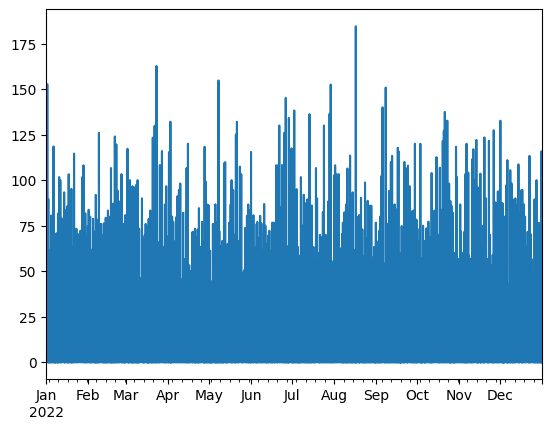

In [18]:
# plotting one column using matplotlib engine (default engine)
hourly_data.line(columns="case 1")

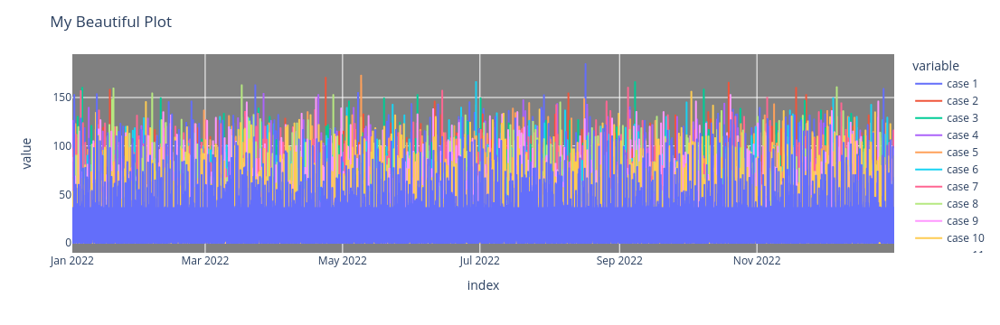

In [20]:
# plotting all columns using plotly engine, you can
hourly_data.line(
    engine="plotly", plot_bgcolor="gray", title="My Beautiful Plot"
)

### Load duration curve
A Load duration curve (LDC), also known as a duration curve or a load-duration profile, represents the cumulative distribution of a given energy demand over a specified period of time. To plot this curve, you may use the `load_duration_curve` function in different modes, like taking a specific column of your data and calculating the mean or sum. To this end, go through the steps below.

<Axes: >

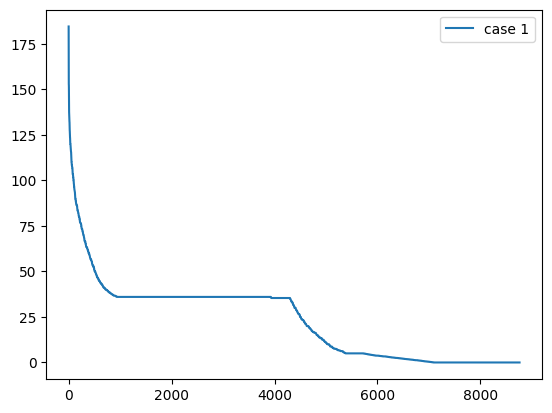

In [21]:
# Taking a column
hourly_data.load_duration_curve(column="case 1")

<Axes: >

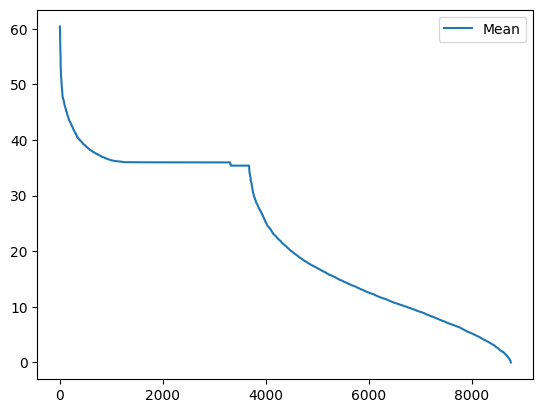

In [22]:
# plotting for mean
hourly_data.mean().load_duration_curve("Mean")

<Axes: >

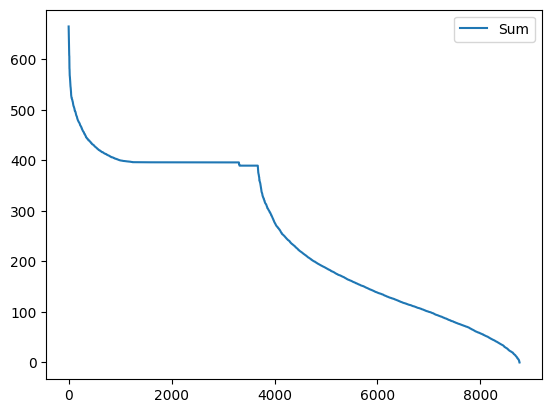

In [24]:
# Taking sum
hourly_data.sum().load_duration_curve("Sum")

### Area Plot
Using the `area` plot function, you can plot the cumulative sum of the the columns in your data.

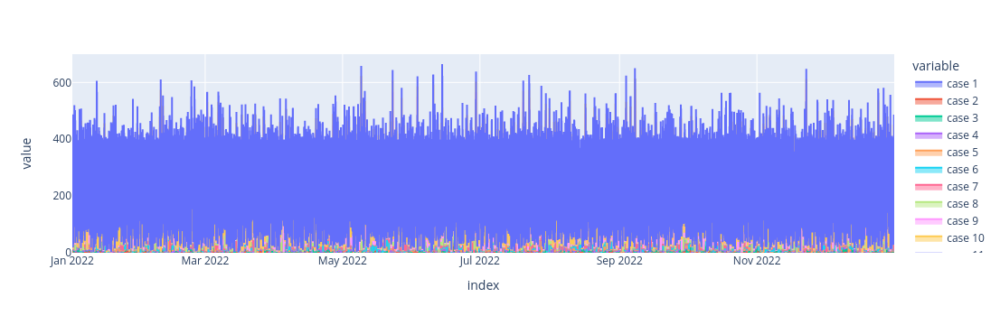

In [26]:
hourly_data.area(engine="plotly")

### Shadow Plot
In case you want to represent all the simulations together to show the variability of stochastic profiles generated by RAMP, you may use the shadow plot.

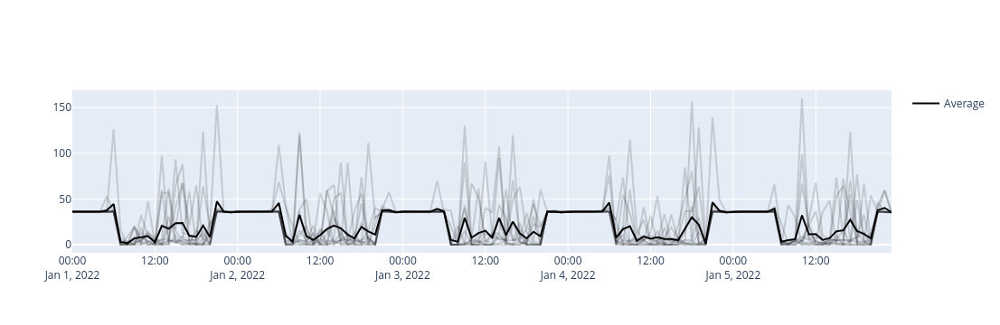

In [27]:
# to have a more visible visualisation, let's only take the first 5 days of the data using the iloc function

hourly_data.iloc(index=slice(0, 24 * 5)).shadow(
    average=True,  # plotting the average with a bold line and all the other columns as a cloud around it
    engine="plotly",
)

### General plot function
The Plot object has a function called `plot` that returns a pd.DataFrame.plot function offering some more plotting routines:

<Axes: >

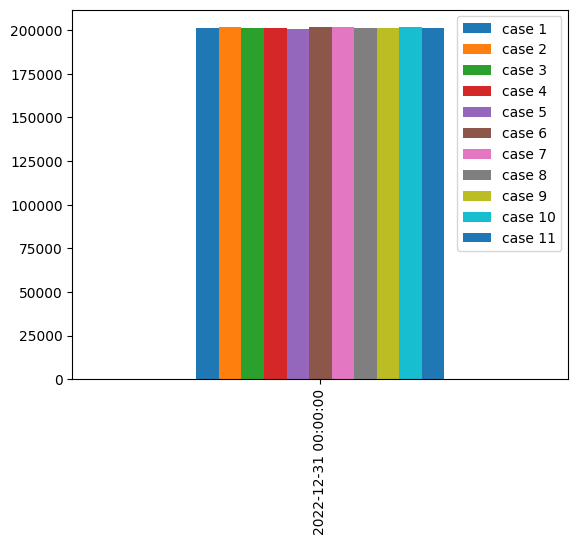

In [28]:
# plotting the yearly consumption of different cases as bar charts
hourly_data.resample("1y", "sum").plot(kind="bar")

## Saving the data into a file

If you want to save the data into a `.csv` or `.xlsx` file, you can use the two save functions:

In [29]:
# saving as csv
hourly_data.to_csv("path and name of csv file.csv")

# saving as xslx
hourly_data.to_excel("path and name of excel file.xlsx")